#  <i><center><span style="color:red">ANALYSIS OF THE COVID-19 PANDEMIC</span></center></i>

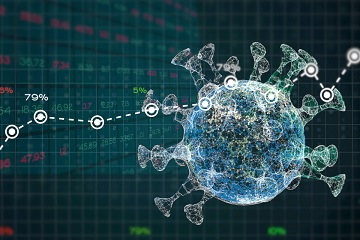

<center> Email: tranhakhanhduy2001@gmail.com</center>

## Table of Contents
<div style="margin-top: 20px">
    
1.  [Introduction to data](#00)<br>
2.  [Data Preprocessing](#0)<br>
    2.1  [Gathering Data](#01)<br>
    2.2  [Data Wrangling](#02)<br>
3.  [EDA](#1) <br>
    3.1  [Overview COVID 19](#11) <br>
    3.2  [What are the current trends in vaccine deployment?](#12) <br>
    3.3  [Which countries lead in getting enough vaccines for their people?](#13) <br>
    3.4  [Vaccines help the world or not?](#14) <br>
    3.5  [ Which COVID-19 Vaccines Are Most Used?](#15) <br>

</div>

# <span style="color:blue">Introduction to data</span><a id="00"></a>

1. Summary Data
- country: designates the Country in which the the row's data was observed.
- continent: designates the Continent of the observed country.
- total_confirmed: designates the total number of confirmed cases in the observed country.
- total_deaths: designates the total number of confirmed deaths in the observed country.
- total_recovered: designates the total number of confirmed recoveries in the observed country.
- active_cases: designates the number of active cases in the observed country.
- serious_or_critical: designates the estimated number of cases in serious or critical conditions in the observed country.
- total_cases_per_1m_population: designates the number of total cases per 1 million population in the observed country.
- total_deaths_per_1m_population: designates the number of total deaths per 1 million population in the observed country.
- total_tests: designates the number of total tests done in the observed country.
- total_tests_per_1m_population: designates the number of total test done per 1 million population in the observed country.
- population: designates the population count in the observed country.
2. Daily Data
- date: designates the date of observation of the row's data in YYYY-MM-DD format.
- country: designates the Country in which the the row's data was observed.
- cumulative_total_cases: designates the cumulative number of confirmed cases as of the row's date, for the row's country.
- daily_new_cases: designates the daily new number of confirmed cases on the row's date, for the row's country.
- active_cases: designates the number of active cases (i.e., confirmed cases that still didn't recover nor die) on the row's date, for the row's country.
- cumulative_total_deaths: designates the cumulative number of confirmed deaths as of the row's date, for the row's country.
- daily_new_deaths: designates the daily new number of confirmed deaths on the row's date, for the row's country.
3. Vaccination Data
- Country- this is the country for which the vaccination information is provided;
- Country ISO Code - ISO code for the country;
- Date - date for the data entry; for some of the dates we have only the daily vaccinations, for others, only the (cumulative) total;
- Total number of vaccinations - this is the absolute number of total immunizations in the country;
- Total number of people vaccinated - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;
- Total number of people fully vaccinated - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;
- Daily vaccinations (raw) - for a certain data entry, the number of vaccination for that date/country;
- Daily vaccinations - for a certain data entry, the number of vaccination for that date/country;
- Total vaccinations per hundred - ratio (in percent) between vaccination number and total population up to the date in the country;
- Total number of people vaccinated per hundred - ratio (in percent) between population immunized and total population up to the date in the country;
- Total number of people fully vaccinated per hundred - ratio (in percent) between population fully immunized and total population up to the date in the country;
- Number of vaccinations per day - number of daily vaccination for that day and country;
- Daily vaccinations per million - ratio (in ppm) between vaccination number and total population for the current date in the country;
- Vaccines used in the country - total number of vaccines used in the country (up to date);
- Source name - source of the information (national authority, international organization, local organization etc.);
- Source website - website of the source of information;

Import Primary Modules

In [1]:
import pandas as pd #data processing, CSV file I/O
import numpy as np #linear algebra
import matplotlib.pyplot as plt #visualization
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.patches as mpatches # needed for waffle Charts
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

# <span style="color:blue">Data Preprocessing</span><a id="0"></a>

### <span style="color:blue">Gathering Data</span><a id="01"></a>

In [2]:
summary_covid = pd.read_csv("./worldometer_coronavirus_summary_data.csv")
daily_covid=pd.read_csv("./worldometer_coronavirus_daily_data.csv")
vacc_covid=pd.read_csv("./country_vaccinations.csv")

In [3]:
summary_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         225 non-null    object 
 1   continent                       225 non-null    object 
 2   total_confirmed                 225 non-null    int64  
 3   total_deaths                    216 non-null    float64
 4   total_recovered                 211 non-null    float64
 5   active_cases                    212 non-null    float64
 6   serious_or_critical             162 non-null    float64
 7   total_cases_per_1m_population   225 non-null    int64  
 8   total_deaths_per_1m_population  216 non-null    float64
 9   total_tests                     211 non-null    float64
 10  total_tests_per_1m_population   211 non-null    float64
 11  population                      225 non-null    int64  
dtypes: float64(7), int64(3), object(2)
m

In [4]:
daily_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170917 entries, 0 to 170916
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   date                     170917 non-null  object 
 1   country                  170917 non-null  object 
 2   cumulative_total_cases   170917 non-null  float64
 3   daily_new_cases          161237 non-null  float64
 4   active_cases             161011 non-null  float64
 5   cumulative_total_deaths  164059 non-null  float64
 6   daily_new_deaths         145063 non-null  float64
dtypes: float64(5), object(2)
memory usage: 9.1+ MB


In [5]:
vacc_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57281 entries, 0 to 57280
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              57281 non-null  object 
 1   iso_code                             57281 non-null  object 
 2   date                                 57281 non-null  object 
 3   total_vaccinations                   30889 non-null  float64
 4   people_vaccinated                    29337 non-null  float64
 5   people_fully_vaccinated              26514 non-null  float64
 6   daily_vaccinations_raw               25291 non-null  float64
 7   daily_vaccinations                   57028 non-null  float64
 8   total_vaccinations_per_hundred       30889 non-null  float64
 9   people_vaccinated_per_hundred        29337 non-null  float64
 10  people_fully_vaccinated_per_hundred  26514 non-null  float64
 11  daily_vaccinations_per_milli

In [6]:
#Converting the datatype of date on daily_data into date format:
daily_covid['date']=pd.to_datetime(daily_covid['date'])
vacc_covid['date']=pd.to_datetime(vacc_covid['date'])

In [7]:
#Uppercase value on column 'Country' in Vaccination Data, Daily Covid data to commpare value:
vacc_covid['country']=vacc_covid['country'].str.upper()
daily_covid['country']=daily_covid['country'].str.upper()

# Find different countries between Vaccination Data and Daily Covid Data:
print("Countries in Vaccination Data and not in Daily Covid data:\n")
print([x for x in vacc_covid.country.unique() if x not in daily_covid.country.unique()])
print("\nCountries in Daily Covid Data and not in Vaccination data:\n")
print([x for x in daily_covid.country.unique() if x not in vacc_covid.country.unique()])

Countries in Vaccination Data and not in Daily Covid data:

['BONAIRE SINT EUSTATIUS AND SABA', 'BRUNEI', 'CAPE VERDE', "COTE D'IVOIRE", 'CZECHIA', 'DEMOCRATIC REPUBLIC OF CONGO', 'ENGLAND', 'ESWATINI', 'FALKLAND ISLANDS', 'GUERNSEY', 'GUINEA-BISSAU', 'HONG KONG', 'JERSEY', 'KOSOVO', 'MACAO', 'NAURU', 'NORTH MACEDONIA', 'NORTHERN CYPRUS', 'NORTHERN IRELAND', 'PALESTINE', 'PITCAIRN', 'SCOTLAND', 'SINT MAARTEN (DUTCH PART)', 'TIMOR', 'TOKELAU', 'TURKMENISTAN', 'TUVALU', 'UNITED KINGDOM', 'UNITED STATES', 'VIETNAM', 'WALES', 'WALLIS AND FUTUNA']

Countries in Daily Covid Data and not in Vaccination data:

['BRUNEI DARUSSALAM', 'CABO VERDE', 'CARIBBEAN NETHERLANDS', 'CHANNEL ISLANDS', 'CHINA HONG KONG SAR', 'CHINA MACAO SAR', 'COTE D IVOIRE', 'CZECH REPUBLIC', 'DEMOCRATIC REPUBLIC OF THE CONGO', 'ERITREA', 'FALKLAND ISLANDS MALVINAS', 'FRENCH GUIANA', 'GUADELOUPE', 'GUINEA BISSAU', 'HOLY SEE', 'MACEDONIA', 'MARSHALL ISLANDS', 'MARTINIQUE', 'MAYOTTE', 'MICRONESIA', 'PALAU', 'REUNION', 'SAIN

#### Since there is a high chance that the same country is spelled differently, I will unify them with the same name:
  
        'BRUNEI': 'BRUNEI DARUSSALAM',
        'CAPE VERDE': 'CABO VERDE',
        'CZECHIA': 'CZECH REPUBLIC',
        'DEMOCRATIC REPUBLIC OF CONGO':'DEMOCRATIC REPUBLIC OF THE CONGO',
        'FALKLAND ISLANDS':'FALKLAND ISLANDS MALVINAS'.
        'GUINEA-BISSAU' : 'GUINEA BISSAU',
        'PALESTINE': 'STATE OF PALESTINE',
        'TIMOR': 'TIMOR LESTE',
        'UNITED KINGDOM':  'UK',
        'UNITED STATES':'USA',
        'VIETNAM':'VIET NAM',
        'WALLIS AND FUTUNA':'WALLIS AND FUTUNA ISLANDS'
        'ESWATINI': 'SWAZILAND' -- This country renamed:
  [Link rename](https://www.theguardian.com/world/2018/apr/19/swaziland-king-renames-country-kingdom-of-eswatini)  

In [8]:
#Fix countrines name different between two datasets
name_dict = {
        'BRUNEI': 'BRUNEI DARUSSALAM',
        'CAPE VERDE': 'CABO VERDE',
        'CZECHIA': 'CZECH REPUBLIC',
        'DEMOCRATIC REPUBLIC OF CONGO':'DEMOCRATIC REPUBLIC OF THE CONGO',
        'FALKLAND ISLANDS':'FALKLAND ISLANDS MALVINAS',
        'GUINEA-BISSAU' : 'GUINEA BISSAU',
        'PALESTINE': 'STATE OF PALESTINE',
        'ESWATINI': 'SWAZILAND',
        'TIMOR': 'TIMOR LESTE',
        'UNITED KINGDOM':  'UK',
        'UNITED STATES':'USA',
        'VIETNAM':'VIET NAM',
        'WALLIS AND FUTUNA':'WALLIS AND FUTUNA ISLANDS',
}

vacc_covid["country"].replace(name_dict,inplace=True)

# drop England, Scotland, Wales, Northern Ireland since they are included in UK 
vacc_covid = vacc_covid[vacc_covid.country.apply(lambda x: x not in ['ENGLAND', 'SCOTLAND', 'WALES', 'NORTHERN IRELAND'])]

print("Countries in Vaccination Data and not in Daily Covid data:\n")
print([x for x in vacc_covid.country.unique() if x not in daily_covid.country.unique()])

Countries in Vaccination Data and not in Daily Covid data:

['BONAIRE SINT EUSTATIUS AND SABA', "COTE D'IVOIRE", 'GUERNSEY', 'HONG KONG', 'JERSEY', 'KOSOVO', 'MACAO', 'NAURU', 'NORTH MACEDONIA', 'NORTHERN CYPRUS', 'PITCAIRN', 'SINT MAARTEN (DUTCH PART)', 'TOKELAU', 'TURKMENISTAN', 'TUVALU']


In [9]:
#Combining Vaccination data and Daily covid data:
inner_vacc_covid = pd.merge(vacc_covid,daily_covid,on=["country","date"])

inner_vacc_covid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52904 entries, 0 to 52903
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   country                              52904 non-null  object        
 1   iso_code                             52904 non-null  object        
 2   date                                 52904 non-null  datetime64[ns]
 3   total_vaccinations                   28554 non-null  float64       
 4   people_vaccinated                    27180 non-null  float64       
 5   people_fully_vaccinated              24557 non-null  float64       
 6   daily_vaccinations_raw               23296 non-null  float64       
 7   daily_vaccinations                   52672 non-null  float64       
 8   total_vaccinations_per_hundred       28554 non-null  float64       
 9   people_vaccinated_per_hundred        27180 non-null  float64       
 10  people_ful

### <span style="color:blue">Data Wrangling</span><a id="02"></a>

In [10]:
# Let's remove unnecessary columns
inner_vacc_covid.drop(columns=['iso_code', 'source_name', 'source_website'], inplace=True)


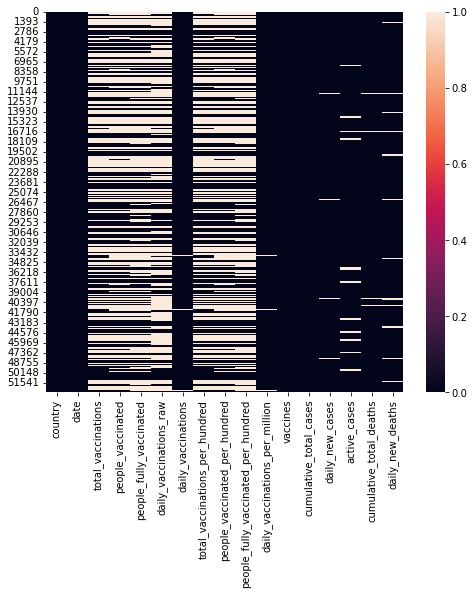

In [11]:
plt.figure(figsize=(8,7))
sns.heatmap(inner_vacc_covid.isna())
plt.show()

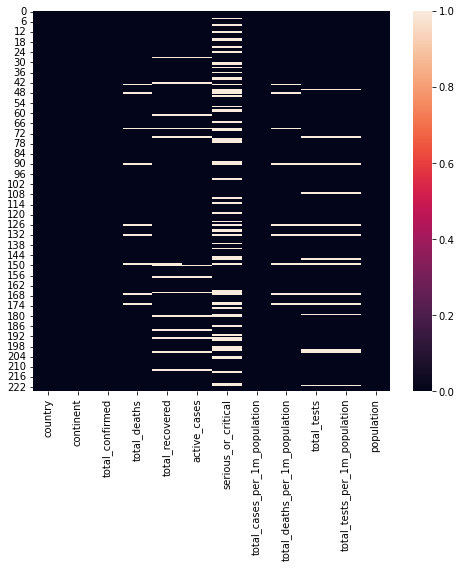

In [12]:
plt.figure(figsize=(8,7))
sns.heatmap(summary_covid.isna())
plt.show()

In [13]:
#Check NaNs Value:
inner_vacc_covid.isna().sum()

country                                    0
date                                       0
total_vaccinations                     24350
people_vaccinated                      25724
people_fully_vaccinated                28347
daily_vaccinations_raw                 29608
daily_vaccinations                       232
total_vaccinations_per_hundred         24350
people_vaccinated_per_hundred          25724
people_fully_vaccinated_per_hundred    28347
daily_vaccinations_per_million           232
vaccines                                   0
cumulative_total_cases                     0
daily_new_cases                          602
active_cases                            2492
cumulative_total_deaths                  559
daily_new_deaths                        2389
dtype: int64

Now we are going to handle NaNs value.There are two ways to doing this:
- Changing the value to zero (Because earlier dates, example: before the release of the COVID vaccine, the number is likely to be zero)

In [14]:
inner_vacc_covid.fillna({'total_vaccinations':0, 'people_vaccinated':0, 'people_fully_vaccinated':0,\
                 'daily_vaccinations':0,'total_vaccinations_per_hundred':0,'daily_vaccinations_raw':0,\
                 'people_vaccinated_per_hundred':0 ,'people_fully_vaccinated_per_hundred':0}\
                 ,inplace=True)
inner_vacc_covid.isna().sum()

country                                   0
date                                      0
total_vaccinations                        0
people_vaccinated                         0
people_fully_vaccinated                   0
daily_vaccinations_raw                    0
daily_vaccinations                        0
total_vaccinations_per_hundred            0
people_vaccinated_per_hundred             0
people_fully_vaccinated_per_hundred       0
daily_vaccinations_per_million          232
vaccines                                  0
cumulative_total_cases                    0
daily_new_cases                         602
active_cases                           2492
cumulative_total_deaths                 559
daily_new_deaths                       2389
dtype: int64

## <span style="color:blue"> EDA </span> <a id="1"></a>

### <span style="color:blue">Overview COVID -19</span><a id="11"></a>

In [15]:

active_cases_df = inner_vacc_covid[['date', 'country', 'active_cases']].dropna().sort_values('date')
active_cases_df['date'] = pd.to_datetime(active_cases_df.date, format='%Y/%m/%d')
active_cases_df['date'] = active_cases_df['date'].dt.strftime('%Y/%m/%d')
active_cases_df = active_cases_df[active_cases_df.active_cases > 0]
active_cases_df['log2(active_cases)'] = np.log2(active_cases_df['active_cases'])

log_scale_vals = list(range(0,25,2))
scale_vals = (np.exp2(log_scale_vals)).astype(int).astype(str)

fig = px.choropleth(active_cases_df, locations="country", locationmode='country names',
                    color="log2(active_cases)", hover_name="country", hover_data=['active_cases'],
                    projection="stereographic", animation_frame="date",
                    title='<b>Coronavirus Active Cases Over Time</b>',
                    color_continuous_scale="ylorrd",
                   )

fig.update_layout(coloraxis={"colorbar": {"title":"<b>Active Cases</b><br>",
                                          "titleside":"top",
                                          "tickmode":"array",
                                          "tickvals":log_scale_vals,
                                          "ticktext":scale_vals}
                            }
                 )
fig.update_geos(projection_type="natural earth2", visible=True, resolution=110)
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 20
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 4
fig.show()

In [16]:
#Create a dataframe contain number of comfirmed cases group by country
active_by_country = inner_vacc_covid[{'country','daily_new_cases'}].groupby('country',as_index=False).sum()
active_by_country['totalcase']=active_by_country['daily_new_cases']
active_by_country.drop('daily_new_cases',axis=1,inplace=True)

In [17]:
fig = px.treemap(active_by_country, path=['country'], values='totalcase', height=700,
title = "<b><span style='color:red '>Current CoronaVirus Confirmed Cases</span></b>",
color_discrete_sequence = px.colors.qualitative.Set2)
fig.update_traces(textinfo= "label+text+value")
fig.show()


First, when looking at the total number of confirmed cases, the United States, India and Brazil are the three countries that have recorded the most infections. In absolute numbers, these three countries have the most populations infected with the COVID-19 virus and appear to have suffered a lot.
These three countries are also the most populous countries in the world.
What is impressive is that China, the country with the largest population in the world and where the covid-19 virus was first discovered and spread, is not even in the top 5 of this list.

In [18]:
total_continents=summary_covid.groupby('continent', as_index=False).sum()
total_continents.set_index('continent',inplace=True)
total_continents.sort_values(by=['total_confirmed'],inplace=True,ascending=False)
total_continents

,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population
continent,,,,,,,,,,
Europe,168463979,1748712.0,144921715.0,15607892.0,11507.0,13819613,108273.0,2.536155e+09,187601198.0,748399480
Asia,130546861,1380136.0,113198090.0,6331082.0,28542.0,4667920,29997.0,1.979515e+09,77373890.0,4667127574
North America,95950761,1429335.0,69718151.0,24793459.0,9318.0,6100537,49988.0,1.084837e+09,83854131.0,596976288
South America,55496051,1270283.0,48391980.0,1691610.0,12196.0,1702436,30637.0,2.132302e+08,12223496.0,436816859
Africa,11652434,251956.0,10771318.0,531755.0,1500.0,1735219,17720.0,9.783572e+07,9862407.0,1395255892
Australia/Oceania,4527205,8412.0,3941913.0,506282.0,144.0,1128371,5840.0,7.302176e+07,9936401.0,43414431


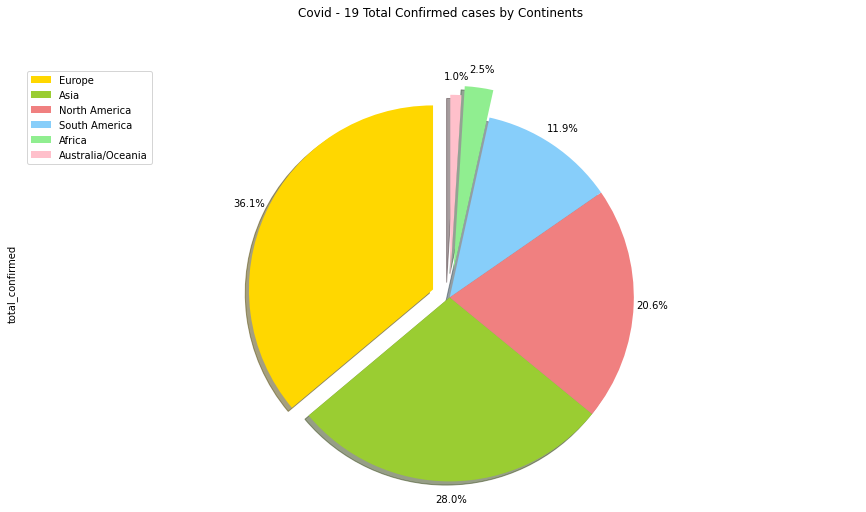

In [19]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink']
explode_list = [0.1, 0, 0, 0, 0.15, 0.1] # ratio for each continent with which to offset each wedge.

total_continents['total_confirmed'].plot(kind='pie',        
                            figsize=(15, 8),
                            autopct='%1.1f%%', 
                            startangle=90,    
                            shadow=True,       
                            labels=None,         
                            pctdistance=1.1,    
                            colors=colors_list, 
                            explode=explode_list 
                            )

plt.title('Covid - 19 Total Confirmed cases by Continents',y=1.1)
plt.axis('equal')
plt.legend(total_continents.index, loc='upper left') 

plt.show()


<Figure size 432x288 with 0 Axes>

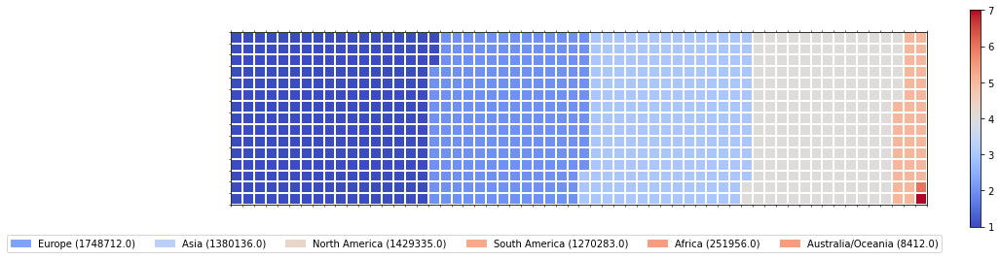

In [20]:
# compute the proportion of each category with respect to the total
total_values = total_continents['total_deaths'].sum()
category_proportions = total_continents['total_deaths'] / total_values

width = 60 # width of chart
height = 15 # height of chart

total_num_tiles = width * height # total number of tiles

# compute the number of tiles for each category
tiles_per_category = (category_proportions * total_num_tiles).round().astype(int)

# initialize the waffle chart as an empty matrix
waffle_chart = np.zeros((height, width), dtype = np.uint)

# define indices to loop through waffle chart
category_index = 0
tile_index = 0

# populate the waffle chart
for col in range(width):
    for row in range(height):
        tile_index += 1

        # if the number of tiles populated for the current category is equal to its corresponding allocated tiles...
        if tile_index > sum(tiles_per_category[0:category_index]):
            # ...proceed to the next category
            category_index += 1       
            
        # set the class value to an integer, which increases with class
        waffle_chart[row, col] = category_index
waffle_chart
# instantiate a new figure object
fig = plt.figure()

# use matshow to display the waffle chart
colormap = plt.cm.coolwarm
plt.matshow(waffle_chart, cmap=colormap)
plt.colorbar()

# get the axis
ax = plt.gca()

# set minor ticks
ax.set_xticks(np.arange(-.5, (width), 1), minor=True)
ax.set_yticks(np.arange(-.5, (height), 1), minor=True)
    
# add gridlines based on minor ticks
ax.grid(which='minor', color='w', linestyle='-', linewidth=2)

plt.xticks([])
plt.yticks([])

# compute cumulative sum of individual categories to match color schemes between chart and legend
values_cumsum = np.cumsum(total_continents['total_deaths'])
total_values = values_cumsum[len(values_cumsum) - 1]

# create legend
legend_handles = []
for i, category in enumerate(total_continents.index.values):
    label_str = category + ' (' + str(total_continents['total_deaths'][i]) + ')'
    color_val = colormap(float(values_cumsum[i])/total_values/1.35)
    legend_handles.append(mpatches.Patch(color=color_val, label=label_str))
        
# add legend to chart
plt.legend(handles=legend_handles,
           loc='lower center', 
           ncol=len(total_continents.index.values),
           bbox_to_anchor=(0., -0.3, 0.7, .1)
          )
plt.show()

- Continents such as Euro, Asia, North America have the highest number of infections. Not surprisingly, all three continents also have the highest number of deaths among continents. 
- Notable continent is South America, although the number of infections accounts for only 11.9%, less than 3 times of Euro and 2 times of North America, but this continent has the same number of deaths as the 3 continents above. After researching, I found that most of the responsibility belongs to Brazil because the country's unreasonable COVID-19 prevention policies have caused the death toll of this country in particular and the continent in general to increase.
[COVID 19 Brazil - Link](https://www.nature.com/articles/s41591-021-01353-2)

### <span style="color:blue">What are the current trends in vaccine deployment?</span><a id="12"></a>

In [21]:
date_dailyvacc = vacc_covid.groupby('date', as_index=False).sum()
date_dailyvacc=date_dailyvacc[['date','daily_vaccinations']]
date_dailyvacc.set_index('date',inplace=True)
group_dailyvacc = date_dailyvacc.groupby(pd.Grouper(freq="M"))
df=group_dailyvacc.sum()
df.reset_index(inplace=True)
df['daily_vaccinations']=df['daily_vaccinations'].astype(int)

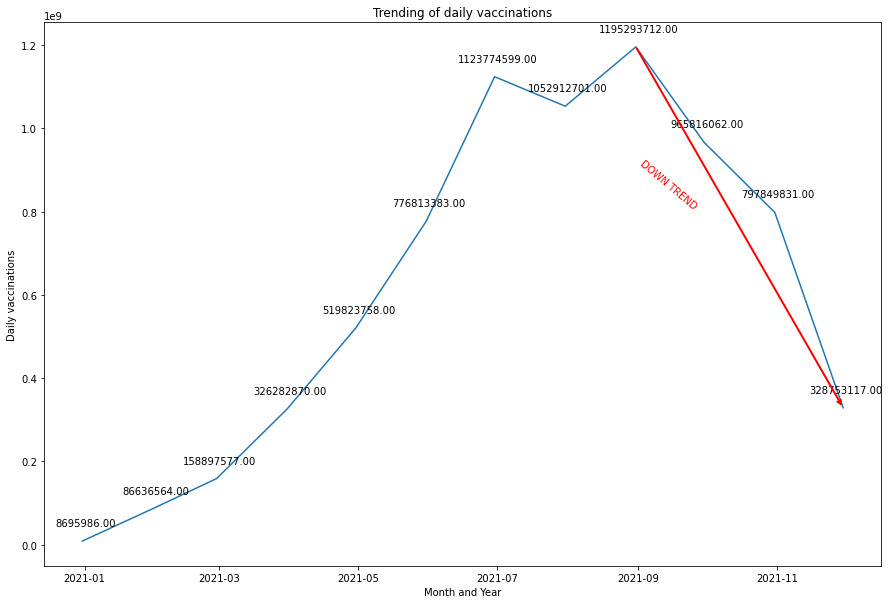

In [22]:
plt.figure(figsize=(15,10))
plt.plot(df['date'],df['daily_vaccinations'])

x_arr=df['date'].tolist()
y_arr=df['daily_vaccinations'].tolist()
plt.title('Trending of daily vaccinations',y=1)
plt.ylabel('Daily vaccinations')
plt.xlabel('Month and Year')
for x,y in zip(x_arr,y_arr):

    label = "{:.2f}".format(y)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(3,15), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center
# Annotate arrow
plt.annotate('',  # s: str. Will leave it blank for no text
             xy=(x_arr[11], 328753117),  # place head of the arrow at point 
             xytext=(x_arr[8], 1195293712),  # place base of the arrow at point
             xycoords='data',  # will use the coordinate system of the object being annotated
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='red', lw=2),
             )
plt.annotate(' DOWN TREND ',  # text to display
             xy=(x_arr[8], 797849831),  # start the text at at point 
             rotation=320,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             color="red",
             )

plt.show()

Looking at the September 2021 chart, the world's daily vaccine supply begins to decline.
The reason may be that developed countries with a large population and infected with covid have completed the first dose of the vaccine and have to wait for the vaccine to take effect, so the deployment of the vaccine has decreased.

### <span style="color:blue">Which countries lead in getting enough vaccines (2 or more shots) for their people?</span><a id="13"></a>

In [23]:
countries_full_vacc = inner_vacc_covid.groupby('country',as_index=False).max()
countries_full_vacc=countries_full_vacc[['country','people_fully_vaccinated']].sort_values(by='people_fully_vaccinated', ascending=False)
countries_full_vacc.reset_index(inplace=True,drop=True)
countries_full_vacc=countries_full_vacc[0:10]
fig = go.Figure(go.Bar(
            x=countries_full_vacc['people_fully_vaccinated'],
            y=countries_full_vacc['country'],
    marker_color = 'lightsalmon',
            orientation='h')
               ,layout=go.Layout(height=500, width=700))
fig.update_layout(title_text='Top 10 countries by people fully vaccinated',xaxis_title='people fully vaccinated')
fig.show()

In [24]:
countries_full_vacc = inner_vacc_covid.groupby('country',as_index=False).max()
countries_full_vacc=countries_full_vacc[['country','people_vaccinated_per_hundred']].sort_values(by='people_vaccinated_per_hundred', ascending=False)
countries_full_vacc.reset_index(inplace=True,drop=True)
countries_full_vacc=countries_full_vacc[0:10]
fig = go.Figure(go.Bar(
            x=countries_full_vacc['people_vaccinated_per_hundred'],
            y=countries_full_vacc['country'],
    marker_color = 'lightsalmon',
            orientation='h')
               ,layout=go.Layout(height=500, width=700))
fig.update_layout(title_text='Top 10 countries by people vaccinated per hundred',xaxis_title='people fully vaccinated')
fig.show()

Looking at the two charts Top 10 countries by people fully vaccinated and Top 10 countries by people vaccinated per hundred we can see:
- CHINA, INDIA, USA are the 3 countries with the highest number of people vaccinated against vaccines, but they do not reflect the deployment capacity of their countries because these are all densely populated and economically developed countries. Just like these countries are the countries that research and develop a vaccine for COVID-19
- 3 countries: GIBLARTAR, UNITED ARAB EMIRATES, PORTUGAL have the ability to deploy vaccines well across their populations.

### <span style="color:blue">Vaccines help the world or not? </span><a id="14"></a>


Check with China, India and USA the 3 countries that have fully vaccinated their people the most

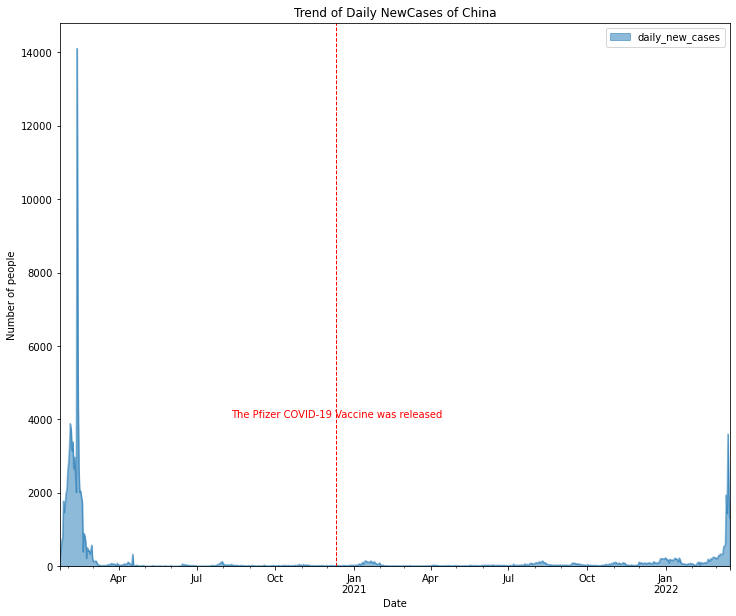

In [25]:
#The Pfizer COVID-19 Vaccine was released on Dec. 11, 2020
china_daily=daily_covid.loc[daily_covid['country']=='CHINA'].dropna()
china_daily=china_daily[['date','daily_new_cases']]
x_arr=china_daily['date'].tolist()
china_daily.set_index('date',inplace=True)
china_daily.plot(kind='area',
             stacked=False,
             figsize=(12, 10))  # pass a tuple (x, y) size

plt.title('Trend of Daily NewCases of China')
plt.ylabel('Number of people')
plt.xlabel('Date')
plt.axvline('2020-12-11', color='red', linestyle='dashed', linewidth=1)

# Annotate Text
plt.annotate('The Pfizer COVID-19 Vaccine was released',  # text to display
             xy=(x_arr[200],4000),  # start the text at at point (year 2008 , pop 30)
             rotation=0,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             color='red',
             )
plt.show()


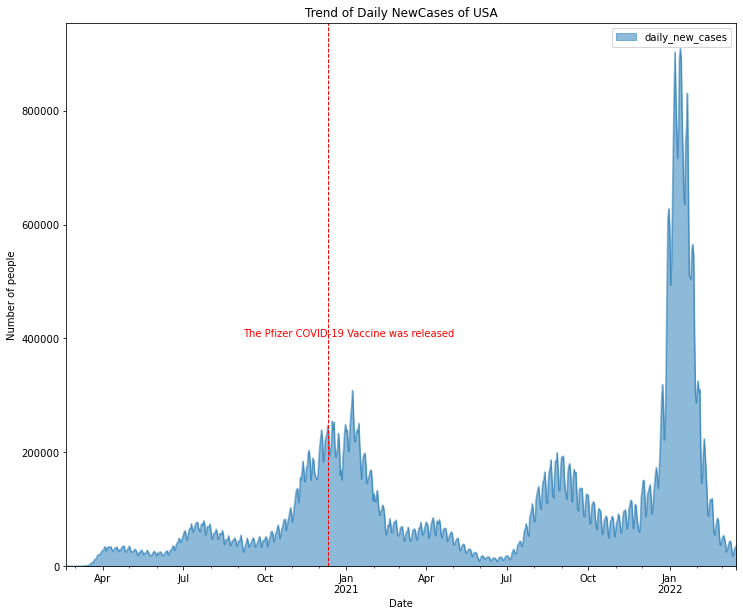

In [26]:
#The Pfizer COVID-19 Vaccine was released on Dec. 11, 2020
usa_daily=daily_covid.loc[daily_covid['country']=='USA'].dropna()
usa_daily=usa_daily[['date','daily_new_cases']]
x_arr=usa_daily['date'].tolist()
usa_daily.set_index('date',inplace=True)
usa_daily.plot(kind='area',
             stacked=False,
             figsize=(12, 10))  # pass a tuple (x, y) size

plt.title('Trend of Daily NewCases of USA')
plt.ylabel('Number of people')
plt.xlabel('Date')
plt.axvline('2020-12-11', color='red', linestyle='dashed', linewidth=1)

# Annotate Text
plt.annotate('The Pfizer COVID-19 Vaccine was released',  # text to display
             xy=(x_arr[200],400000),  # start the text at at point (year 2008 , pop 30)
             rotation=0,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             color='red',
             )
plt.show()


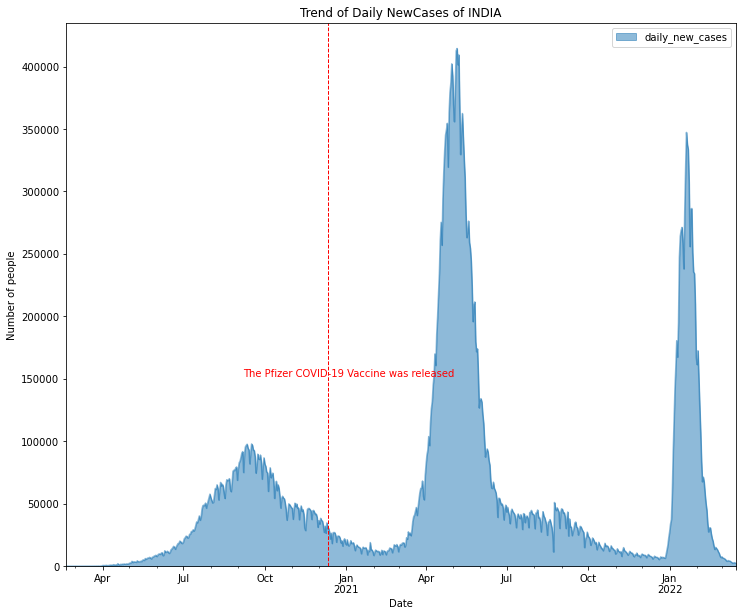

In [27]:
#The Pfizer COVID-19 Vaccine was released on Dec. 11, 2020
india_daily=daily_covid.loc[daily_covid['country']=='INDIA'].dropna()
india_daily=india_daily[['date','daily_new_cases']]
x_arr=india_daily['date'].tolist()
india_daily.set_index('date',inplace=True)
india_daily.plot(kind='area',
             stacked=False,
             figsize=(12, 10))  # pass a tuple (x, y) size

plt.title('Trend of Daily NewCases of INDIA')
plt.ylabel('Number of people')
plt.xlabel('Date')
plt.axvline('2020-12-11', color='red', linestyle='dashed', linewidth=1)

# Annotate Text
plt.annotate('The Pfizer COVID-19 Vaccine was released',  # text to display
             xy=(x_arr[200],150000),  # start the text at at point (year 2008 , pop 30)
             rotation=0,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             color='red',
             )
plt.show()


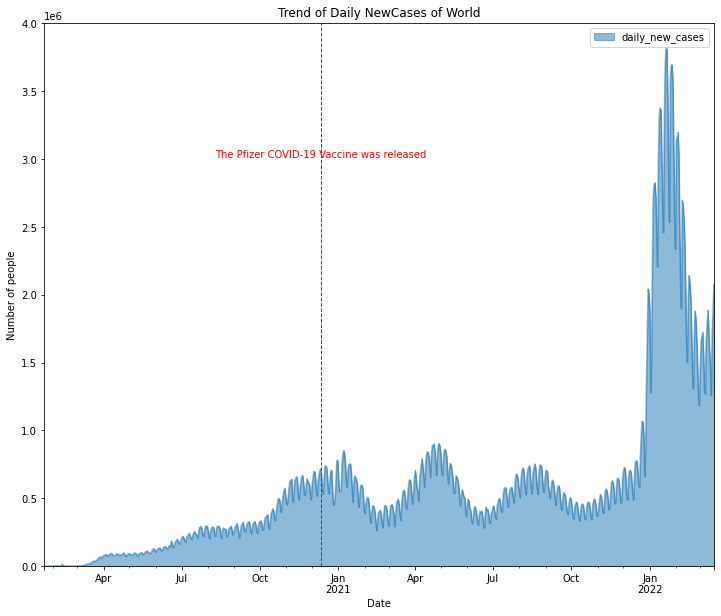

In [28]:
#The Pfizer COVID-19 Vaccine was released on Dec. 11, 2020
world_daily=daily_covid.groupby('date',as_index=False).sum().dropna()
world_daily=world_daily[['date','daily_new_cases']]
x_arr=world_daily['date'].tolist()
world_daily.set_index('date',inplace=True)
world_daily.plot(kind='area',
             stacked=False,
             figsize=(12, 10))  # pass a tuple (x, y) size

plt.title('Trend of Daily NewCases of World')
plt.ylabel('Number of people')
plt.xlabel('Date')
plt.axvline('2020-12-11', color='red', linestyle='dashed', linewidth=1)

# Annotate Text
plt.annotate('The Pfizer COVID-19 Vaccine was released',  # text to display
             xy=(x_arr[200],3000000),  # start the text at at point (year 2008 , pop 30)
             rotation=0,  # based on trial and error to match the arrow
             va='bottom',  # want the text to be vertically 'bottom' aligned
             ha='left',  # want the text to be horizontally 'left' algned.
             color='red',
             )
plt.show()


The USA, CHINA, INDIA in particular and the world in general, after vaccination, have reduced the number of daily covid 19 infections, but it did not last long. From the chart of the 3 countries that vaccinate the most populous with the chart of the whole world, we can see that the vaccine really helps people avoid Covid 19 infection, but it is not absolute. Without the right measures of the government and the coordination and awareness of the people, the number of people infected with Covid 19 will still increase.

### <span style="color:blue">Which COVID-19 Vaccines Are Most Used?  </span><a id="15"></a>

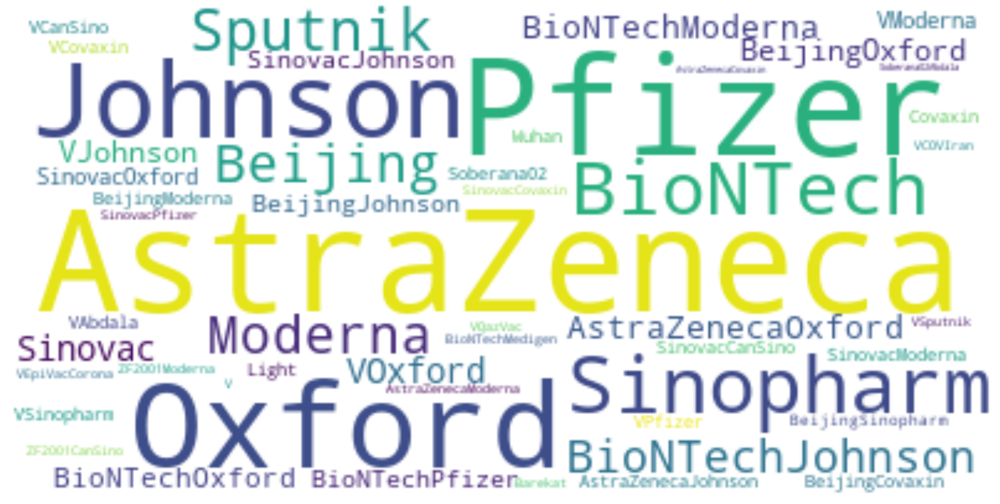

In [29]:

plt.figure(figsize= (30,20))
words= "".join(inner_vacc_covid["vaccines"])
wordcd = WordCloud(collocations=False, background_color ="white",).generate(words)
plt.imshow(wordcd,interpolation='bilinear')
plt.axis("off") 
plt.show()  

From WordCloud we have seen some widely used vaccines such as: Plizer, Oxford, AstraZeneca, Johnson, Sinopharm, ..

#### There's no way to tell how long the pandemic will continue. There are many factors, including the public’s efforts to slow the spread, researchers’ work to learn more about the virus, their search for a treatment, and the success of the vaccines. Remember, the best covid vaccine is the one available to you. So, wait for your chance and go take a shot! Help others get others and convince them in all the ways you possibly can. Wear a mask (even if you're fully vaccinated), use sanitizers and I'm guessing by now, you know the drill! Hoping to see the end point in sight, let's bring this virus down, together! 



### Thank you for reading this far. All your opinions are welcome!